# Image Reduction Module
**Lecturer:** Nicha Leethochawalit<br>
Much of the content of this Jupyter notebook lesson is taken from the GROWTH Summer School 2020 (Dan Perley, Kishalay De & Cameron Hummel - http://growth.caltech.edu/growth-school-2020.html) 
For the benefit of your learning, please refrain from looking at the material from the GROWTH school before finishing your tasks.

## Objective
Process raw images from a visible wavelength telescope and make them ready for photometric analysis

## Key steps
- Reduce raw images by applying biases, darks & flats
- Align and combine consecutive images

## Required dependencies

See GROWTH school webpage for detailed instructions on how to install these modules and packages.  Nominally, you should be able to install the python modules with `pip install <module>` (or `pip3 install <module>`).  The external astromatic packages are easiest installed using package managers (e.g., `rpm`, `apt-get`).

### Python modules
* python 3
* astropy
* numpy
* matplotlib
* photutils

***

## Setup

### Import modules

In [1]:
## Import necessary modules 

from astropy.io import fits
from astropy.wcs import WCS
from astropy.stats import sigma_clipped_stats
from astropy.visualization import make_lupton_rgb

import glob
import os
import subprocess
import warnings
import numpy as np
import matplotlib.pyplot as plt
import photutils
import pyregion
import scipy

# You can ignore any warnings that appear below, but if any modules can't be imported you need to install them

### Define where data live

The various directories where data live are defined here for use later in this notebook.

In [2]:
## Define data directories

curpath = os.path.abspath('.')                    # top level directory
dataFolder = os.path.join(curpath, 'data')        # data directory
biasFolder = os.path.join(dataFolder, 'bias')     # bias frames subdirectory
darkFolder = os.path.join(dataFolder, 'dark')     # dark frames subdirectory
flatFolder = os.path.join(dataFolder, 'flat')     # flat fields subdirectory
sciFolder = os.path.join(dataFolder, 'science')   # science data subdirectory
procFolder = os.path.join(curpath, 'processing')  # processing directory
if not os.path.isdir(procFolder): 
    os.mkdir(procFolder)
else:
    for f in os.listdir(procFolder):
        try:
            os.remove(os.path.join(procFolder,f)) # clear the processing folder from previous iterations
        except:
            print('Could not remove',f)

Next we get lists of all the various file types, including lists and names of files we'll be writing out later.

In [3]:
## Get file lists

os.chdir(sciFolder)
fileList = sorted(glob.glob('*.fits'))
os.chdir(curpath)
biasList = sorted(glob.glob(os.path.join(biasFolder,'*.fits')))
darkList = sorted(glob.glob(os.path.join(darkFolder,'*.fits')))
flatList = sorted(glob.glob(os.path.join(flatFolder,'*.fits')))
sciList = [os.path.join(sciFolder, file) for file in fileList]
procList = [os.path.join(procFolder, file).replace('.fits','.proc.fits') for file in fileList]
alignedList = [os.path.join(procFolder, file).replace('.fits','.aligned.fits') for file in fileList]
combinedFile = os.path.join(procFolder, 'NGC7331_%s_combined.fits') #leave space for filter
rmsFile = os.path.join(procFolder, 'NGC7331_%s_rms.fits')
print('Found',len(biasList),'bias files; ',len(flatList),'flat files; ',len(sciList),'science files')


Found 10 bias files;  43 flat files;  15 science files


For this module we will turn off python warnings, since the properties of the files we'll be using tend to generate quite a few spurious warnings messages that would distract from the content of the module.  In general it's better to turn off warnings more selectively only for sections that require it, but hiding warnings globally makes the code a little simpler to read.

In [4]:
warnings.filterwarnings("ignore")

***

## Preliminary Data Inspection and Exploration

Like nearly all astronomical images, our data are stored in the form of FITS files.   FITS files contain a plaintext header storing the observational metadata (e.g. the name of the telescope) plus an array of pixel data.  FITS files can may be 'simple' (single header, single pixel image) or may contain extensions (additional headers and/or pixel images).  

FITS files are loaded and examined using the astropy library in python.  Below we open up a FITS file and take a look at its structure.

In [5]:
## Open an example FITS file

exampleFile = sciList[0]         # The first science image
HDUList = fits.open(exampleFile) # Open the file
HDUList.info()                   # Print some information about the FITS file structure.  

Filename: /Users/nleethochawa/Documents/Workshops/ASTRO101-2023/data/science/2023_08_23T04.02.30.985Z_B.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      58   (1024, 1024)   int16 (rescales to uint16)   


This reveals that this HDUList only contains one logical header/data unit (HDU). Both FITS header metadata and pixel data are in extension 0.  The image dimensions are 1024x1024 pixels.


### Investigate the header

A good FITS header will contain almost everything we need to know about the observation.  Header data is stored as keyword + value pairs, optionally with a comment following the value.  Keywords are all-capitals and 8 characters or less; corresponding values can be much longer.  There is almost no standardization in the use of keywords at different telescopes, but OBJECT and EXPTIME are commonly used to store the name of the object being observed and the integration time in seconds, respectively.

Below we will load the header and print out a limited set of the header lines in "raw" format (showing how the header metadata is stored in the file), and also look up a few specific bits of information using their keywords.

In [6]:
## Print some header properties

header = HDUList[0].header # Get the header out of the HDU list.
print(repr(header)) #Print header (in raw format).
print()
print('The object is:', header['OBJECT'])   # Print the name of the object being observed
print('The image was taken with %s filter'%(header['FILTER'])) # Print filter
print('The exposure time is:', header['EXPTIME'])  # Print the exposure time
print('The observation date/time is:', header['DATE']) #Print date of the observation

SIMPLE  =                    T / C# FITS: 8/22/2023 9:03:49 PM                  
BITPIX  =                   16 / 8 unsigned int, 16 & 32 int, -32 & -64 real    
NAXIS   =                    2                                                  
NAXIS1  =                 1024                                                  
NAXIS2  =                 1024                                                  
VSSPEED =                67.29 /  /pixel ({"0":5.690000057220459,"1":11.28999996
FOCUSPOS=              3779.84 /  m                                             
ROTATOR =                275.3 / degs. (ALT Az Detotate is ON)                  
OBSID   = '23C5NA  '                                                            
EXPID   =                    1                                                  
XORGSUBF=                    1                                                  
YORGSUBF=                    1                                                  
SECPIX  =                  0

From this we can infer that this is a a B-band image taken with TRT-SRO (Thai Robotic Telescope at Sierra Remote Observatories) of NGC7331 vicinity by Samaporn Tinyanont, one of our lecturers.

### Examine the data

It's usually also a good idea to visually inspect the data to get a feel for its appearance and to make sure it doesn't have any obvious problems before we analyze it.  We will use the imshow command within pyplot, which requires us to provide some parameters defining the minimum and maximum range of the colorbar scale.  For this, we will use sigma-clipped image pixel statistics to come up with some reasonable values.

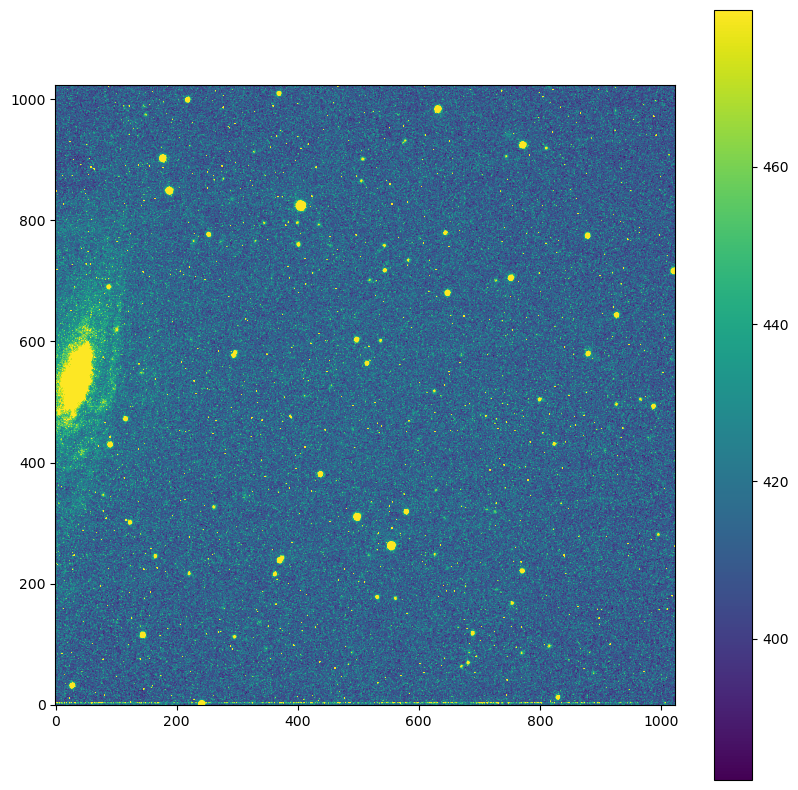

In [7]:
## Get and display the image data

data = HDUList[0].data  # Get the data array (a simple numpy array) from the first extension.

mean, median, std = sigma_clipped_stats(data) # get some image statistics
plt.figure(figsize=(10,10))                     # set up the plot panel
plt.imshow(data, vmin = median - 2*std, vmax = median + 5*std, origin='lower')
plt.colorbar()
plt.show()

This shows us that the NGC object is on the left of the image.

In [8]:
HDUList.close()                  # Close the file (good practice to save ram space)

***

## Creating a bias frame

The detector image comes with an electronic offset introduced by the voltages applied to the amplifier. We have to remove this offset to get real counts received by the detector. 

Different bias-removal methods are employed by different detectors.  In most cases, we record a set of images ("bias frames") with zero exposure time, so that the recorded image reflects *only* the intrinsic offsets in the detector (the detector does not receive any photons if the exposure time is zero).  To reduce detector noise and to remove cosmic ray contamination, we usually take many bias frames and average them together using median-combination.  (Even though the exposure time is zero, cosmic rays can strike the detector during readout.)

### Investigate the data

As always, it's a good idea to inspect your images before you process them.  Open the first bias image and verify that it doesn't contain any obvious astronomical signals.

#### Exercise 1: Open and display the first bias image, and determine its median and clipped standard deviation.

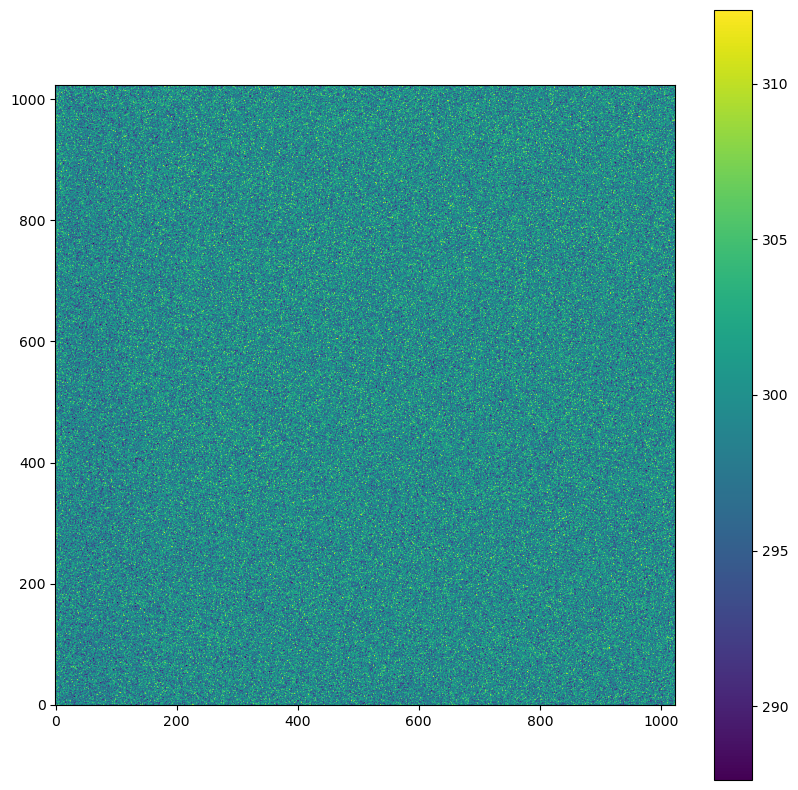

Median: 300.0
Standard deviation: 6.189378822513234


In [9]:
## EXERCISE 1:  Display the first bias image and determine its clipped standard deviation.

biasFile = biasList[0]        # The first science image
HDUList = fits.open(biasFile) # Open the file
data = HDUList[0].data   # Get the data array (a simple numpy array) from the first extension.
HDUList.close()          # File can be closed as soon as the data is copied out of it.

mean, median, std = sigma_clipped_stats(data)   # get some image statistics
plt.figure(figsize=(10,10))                     # set up the plot panel
plt.imshow(data, vmin = median - 2*std, vmax = median + 2*std, origin='lower')
plt.colorbar()
plt.show()

print('Median:', median)
print('Standard deviation:', std)


You should see a predominantly empty image.

### Median-combine the bias images

This process could be repeated with the other four images (in Python or using external software like DS9), but we'll trust the data for now and proceed to the next step, which is to combine all five bias frames together.  To do this, we set up a 3D numpy array and put a bias frame in each layer, and then median-combine along the 3rd dimension to produce a single, median-combined image (our "master bias").

In [10]:
## Median-combine the bias frames to make a master bias
numBiasFiles = len(biasList)
for i in range(numBiasFiles):
    HDUList = fits.open(biasList[i])     # Open the file
    if i==0:
        # Create a 3D array to store all the bias files together.
        ny, nx = HDUList[0].data.shape
        biasImages = np.zeros((ny, nx, numBiasFiles))
    # Add the files to the array
    biasImages[:,:,i] = HDUList[0].data  # Load the data into the appropriate layer
    HDUList.close()                      # Close the file

# Create the master bias frame by doing a median combination for each pixel over all layers
masterBias = np.median(biasImages, axis=2)


#### Exercise 2: Display the master bias image and check that the noise is reduced compared to a single bias frame by calculating and printing out its (sigma-clipped) standard deviation.

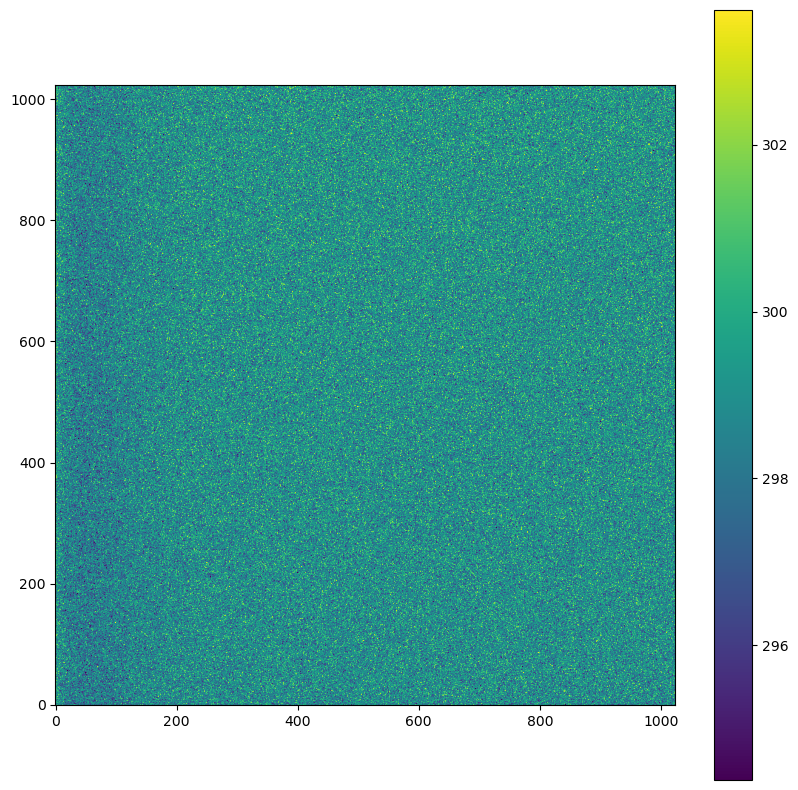

Median: 299.0
Standard deviation: 2.30986328115124


In [11]:
## EXERCISE 2:  Display the master bias image and calculate its median and clipped standard deviation.

mean, median, std = sigma_clipped_stats(masterBias) # get some image statistics

plt.figure(figsize=(10,10))                     # set up the plot panel
plt.imshow(masterBias, vmin = median - 2*std, vmax = median + 2*std, origin='lower')
plt.colorbar()
plt.show()

print('Median:', median)
print('Standard deviation:', std)


It should look pretty similar to the individual bias frame, but with lower noise.  Read noise is generally negligible compared to the sky noise for broadband imaging observations.  However, for narrowband observations or for spectroscopy this may not be the case, so it's always a good idea to take many bias frames if possible.

***

## Creating a master dark image

First, we have to subtract bias from all dark frames. The rest of the process is similar to creating a master bias but we just have to take exposure time into account. The master dark should be normalized to 1 s exposure time.


In [12]:
for darkfile in darkList:
    header = fits.getheader(darkfile) # another way to get header quickly
    print('%s exposure time = %f s'%(os.path.basename(darkfile),header['EXPTIME']))

D-1-60000.000-1-1-20230822-1.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-10.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-2.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-3.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-4.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-5.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-6.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-7.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-8.fits exposure time = 60.000000 s
D-1-60000.000-1-1-20230822-9.fits exposure time = 60.000000 s


In [13]:
## Median-combine the dark frames to make a master dark
numDarklFiles = len(darkList)
for i in range(numDarklFiles):
    HDUList = fits.open(darkList[i])     # Open the file
    if i==0:
        # Create a 3D array to store all the dark files together.
        ny, nx = HDUList[0].data.shape
        darkImages_norm = np.zeros((ny, nx, numBiasFiles))
    # bias subtract, normalize with the exposure time, and add to the 3D array
    exposureTime = HDUList[0].header['EXPTIME']
    darkImages_norm[:,:,i] = (HDUList[0].data-masterBias)/exposureTime  # each layer contains dark-subtracted and normalized dark frame
    HDUList.close()                      # Close the file


#### Exercise 3: Create a master dark image by taking the median of all the dark frames that are biased subtracted and normalized from above.

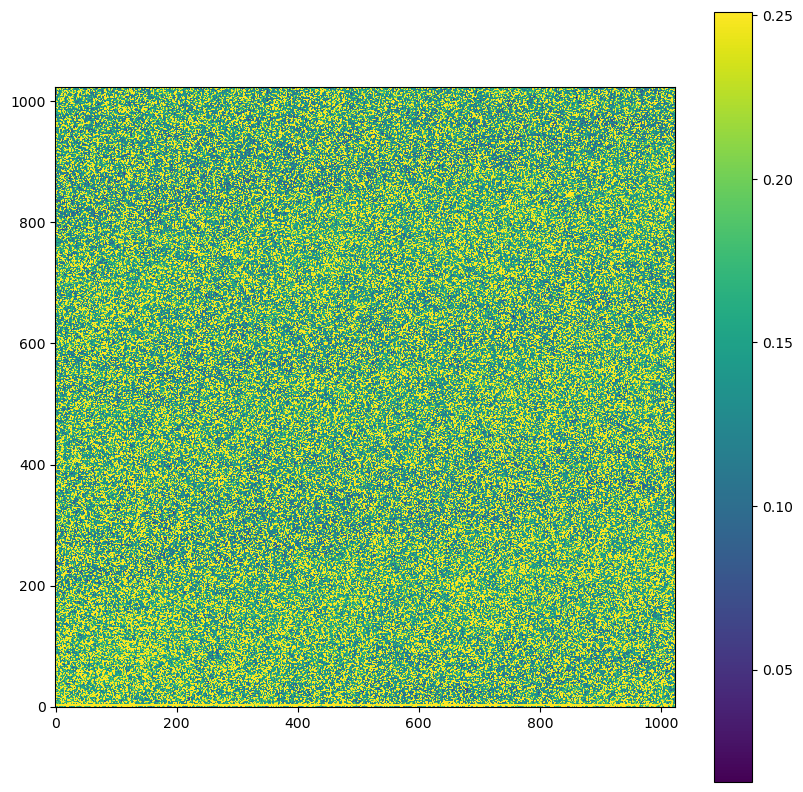

Median: 0.13333333333333333
Standard deviation: 0.05883194381498639


In [14]:
## EXERCISE 3: Median-combine the dark frames to make a master dark

# Create the master bias frame by doing a median combination for each pixel over all layers
masterDark_norm = np.median(darkImages_norm, axis=2)

# Display the master bias image and calculate its median and clipped standard deviation.
mean, median, std = sigma_clipped_stats(masterDark_norm) # get some image statistics

plt.figure(figsize=(10,10))                     # set up the plot panel
plt.imshow(masterDark_norm, vmin = median - 2*std, vmax = median + 2*std, origin='lower')
plt.colorbar()
plt.show()

print('Median:', median)
print('Standard deviation:', std)

You can see that dark noise is quite low (0.13 per second). Usually we can ignore dark correction but here we will include it for formallity.

***

## Creating a flat field

The image recorded on the detector $I(x,y)$ is a product of the true surface brightness on the sky $S(x,y)$, the response of the detector in different parts of the image $F(x,y)$, and integration time $t$. On top of this, there are noises from dark current and bias i.e.: 

$I(x,y) = F(x,y) S(x,y) t + D(x,y) t + B(x,y)$.  

We already have $D(x,y)$ and $B(x,y)$ from the procedures above. We now need to determine $F(x,y)$ to reconstruct $S(x,y)$.

To do this, we expose the detector to a uniform light source -- this can either be a uniformly illuminated part of the telescope dome or the twilight sky (the assumption is that the sky is uniformly bright over a small field of view).

Note that $S(x,y)$ is still not exactly the surface brightness of astronomical objects. In fact, it is the surface brightness from astronomical objects combined with sky brightness. (Dark sky is not really dark, especially on earth).

### Investigate the data

As usual it's good to start by looking at the data.  During the second <font color='red'>breakout segment</font> you will visually examine the first image and print out a few basic properties for the remaining images.

#### Exercise 4: Open and display the first flat-field image.

57174.018428887146 57150.0 799.9359347967157


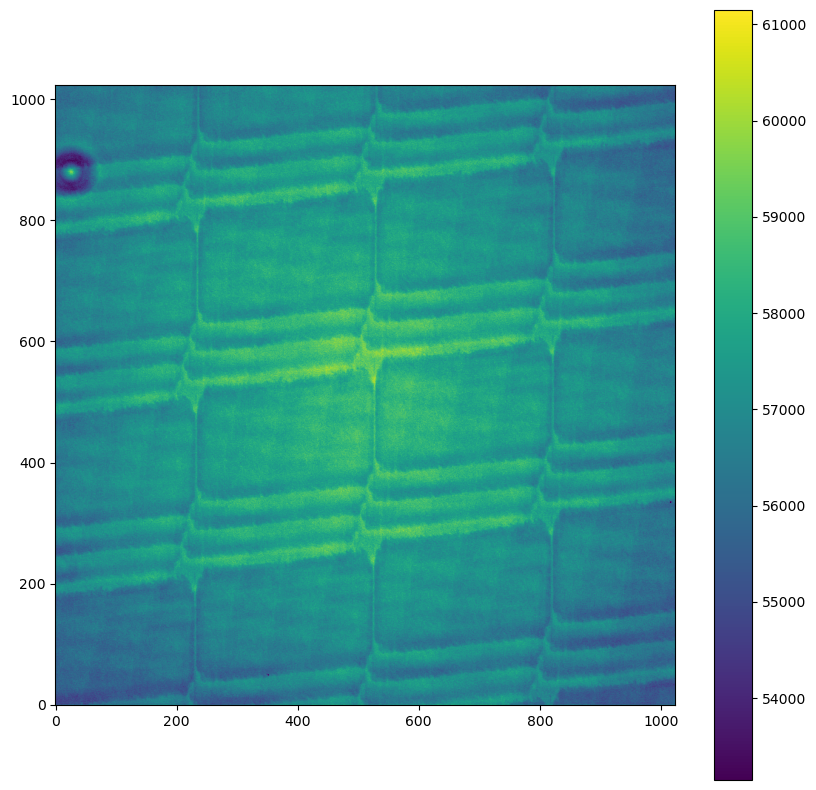

In [15]:
## EXERCISE 4:  Display the first flat-field image.  

flatFile = flatList[0]        # The first flat image
HDUList = fits.open(flatFile) # Open the file
data = HDUList[0].data        # Get the data array (a simple numpy array) from the first extension.
HDUList.close()

mean, median, std = sigma_clipped_stats(data[500:1600,500:1600]) # get some image statistics for exposed pixels
print(mean, median, std)

plt.figure(figsize=(10,10))                     # set up the plot panel
plt.imshow(data, vmin = median - 5*std, vmax = median + 5*std, origin='lower')
plt.colorbar()
plt.show()


You should be able to see that the response of the detector to indidental flux is not 'flat'. There is apparent structure with significantly higher counts and some round defect at the left edge of the detector.  You will likely want to play around with the "vmin" and "vmax" values a bit to see this structure.  Once you see this, please continue to the next exercise.

It's a good idea to scan through all the flat-field files to make sure that the configuration is what we expect (e.g. the filter didn't change) and that the frames aren't saturated.  In the next exercise you will write a loop to do this check.

#### Exercise 5: Verify that all five flat-field images are acceptable by looping over each file and printing out the filter (FILTER keyword), the exposure time (EXPTIME keyword), median pixel value, and 95th percentile value (calculated from the data).

In [16]:
## EXERCISE 5: Verify that all five flat-field images are acceptable by printing out some basic properties.
print('Filter EXPtime medianval 95th_Percentile')
for fileName in flatList:
    HDUList = fits.open(fileName)
    header = HDUList[0].header # Get the header out of the HDU list.
    data = HDUList[0].data
    median = np.median(data)
    percentile_95 = np.percentile(data,95)
    print(header['FILTER'], header['EXPTIME'], median, percentile_95)
    HDUList.close()


Filter EXPtime medianval 95th_Percentile
B 3 57138.0 58526.25
B 3 54798.0 56135.0
B 3 53380.0 54683.0
B 3 50671.0 51908.0
B 3 49343.0 50552.0
B 3 48070.0 49248.0
B 3 46778.0 47924.0
B 3 45556.0 46674.0
B 3 44350.0 45442.0
B 3 43154.0 44218.0
B 3 42008.0 43045.0
B 3 40887.0 41894.0
B 3 39799.0 40781.0
B 3 38723.0 39683.0
B 3 37674.0 38611.0
B 3 36653.0 37563.0
B 3 33208.0 34037.0
B 3 32330.0 33138.0
R 3 52997.0 54181.0
R 3 39469.0 40365.0
R 3 38302.0 39172.0
R 3 37160.0 38011.0
R 3 36033.0 36861.0
R 3 34958.0 35765.0
R 3 33893.0 34669.0
R 3 51322.0 52465.0
R 3 49745.0 50863.0
R 3 48214.0 49303.0
R 3 46743.0 47792.0
R 3 44564.0 45568.0
R 3 43245.0 44221.0
R 3 41949.0 42902.0
R 3 40679.0 41602.0
V 3 42381.0 43181.0
V 3 32382.0 33012.0
V 3 41141.0 41921.0
V 3 39960.0 40718.0
V 3 38638.0 39372.0
V 3 37514.0 38230.0
V 3 36407.0 37104.0
V 3 35364.0 36045.0
V 3 34319.0 34978.0
V 3 33333.0 33973.0


Your output should confirm that the flat images are taken in three filters (B, V, R). All have an exposure time of 3 s. All have median and 95th percentile count values that are well below the saturation level of 65000.

### Normalize and combine flat-fields

The master flat field is formed by median combination in a similar way to the master dark frame, above.  There are two big differences.  First, we have to remove the bias and dark from each image.  Second, we have to adjust for the fact that the light level may be changing from image to image by measuring the average pixel level in each image and dividing the image by it (normalizing).

It is important that this normalization level be calculated only with pixels for which there is actually some signal (In some instruments, the field of view is smaller than the CCD area). Then we divide by this factor and stick it into the appropriate layer of a 3D array.  The median combination at the end is left an an exercise for you.

In [17]:
## getting the names of the flat fields grouped into their filters
filters = ['B','V','R']
flatList_by_filter = {}
for filt in filters:
    flatList_by_filter[filt] = [] #empty list
    #getting the list of flat fields in this filter
    for fileName in flatList:
        header = fits.getheader(fileName) # Get the header for this file.
        if header['FILTER'] == filt:
            flatList_by_filter[filt].append(fileName)

#### Exercise 6: Perform the median combination to produce a 2D array. Save it in a dictionary called masterFlat.

In [18]:
## Load and normalize the flat fields in preparation for making a master flat field for each filter.
masterFlat = {}
for filt in filters:
    # Set up the 3D array
    numFlatFiles = len(flatList_by_filter[filt])
    flatImages = np.zeros((ny, nx, numFlatFiles))
    # Load the files into the array, with bias subtraction and normalization
    for i in range(numFlatFiles):
        # Load the data from the fits file
        HDUList = fits.open(flatList_by_filter[filt][i])
        data = HDUList[0].data * 1. #convert to float
        exptime = HDUList[0].header['EXPTIME']
        HDUList.close()
        #EXERCISE 6.1 :Subtract bias and dark
        data = data - masterDark_norm*exptime - masterBias
        normfactor = np.median(data) #normalize 
        flatImages[:,:,i] = data / normfactor #add it to the layer
    
    ## EXERCISE 6.2: Median-combine the flat field layer array into a masterFlat.
    cur_masterFlat = np.median(flatImages, axis=2)
    
    mean, median, std = sigma_clipped_stats(cur_masterFlat) # get some image statistics
    print(filt, mean, median, std)
    
    masterFlat[filt] = cur_masterFlat

B 1.0002813937904131 0.9999604259542554 0.01379274456135925
V 0.9997516274508504 1.0000718412010439 0.011184240460804771
R 0.9987921186102393 1.0001302029314807 0.015229232430481701


#### Exercise 7: Display them. (Be smart with the scaling via vmin/vmax.)

1.0002813937904131 0.9999604259542554 0.01379274456135925


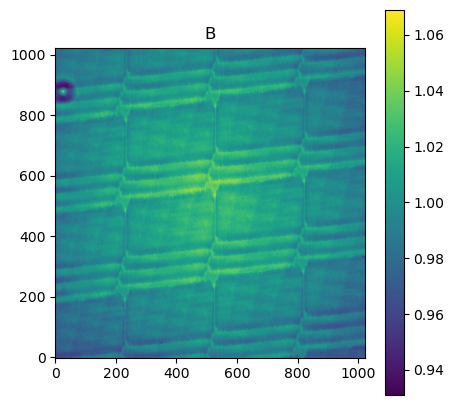

0.9997516274508504 1.0000718412010439 0.011184240460804771


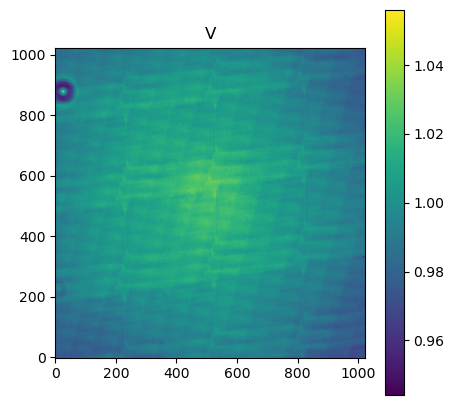

0.9987921186102393 1.0001302029314807 0.015229232430481701


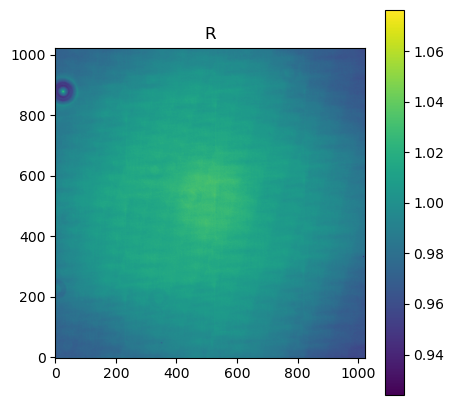

In [19]:
## EXERCISE 7: Median-combine the flat field layer array into a master flat and display it.

for filt in filters:
    mean, median, std = sigma_clipped_stats(masterFlat[filt]) # get some image statistics
    print(mean, median, std)

    plt.figure(figsize=(5,5))                     # set up the plot panel
    plt.imshow(masterFlat[filt], vmin=median-5*std, vmax=median+5*std, origin='lower')
    plt.colorbar()
    plt.title(filt)
    plt.show()


At this point, we have the necessary calibration images to reduce science images and visualize the true brightness distribution on the sky.  Remember that the observed intensity on the detector is:

$I(x,y) = F(x,y) S(x,y) t + D(x,y) t + B(x,y)$.  

We now have to retrieve $S(x,y)$ from $I(x,y)$, by inverting this equation, i.e.:

$S(x,y) = \frac{I(x,y) - D(x,y) t -B(x,y)}{F(x,y)}$

## Pre-processing science frames

Now we will apply the bias, dark, and flat calibrations to the science frames and write processed science frames to disk for further processing.  To simplify matters, we will write these processed files in 'simple' FITS format, combining the primary header data with the (bias-, dark- and flat-corrected) image data in the FITS extension for each file.

In [20]:
## Bias subtract and flat-field all science frames and write out pre-processed files.
numSciFiles = len(sciList)
for i in range(numSciFiles):
    # We know that we only have one science image per filter, so there is no need to loop over the same filters.
    # Read in the FITS data.
    HDUList = fits.open(sciList[i])
    primaryHeader = HDUList[0].header
    imageData = HDUList[0].data    
    HDUList.close()
    
    #get the filter and exptime
    filt = primaryHeader['FILTER']
    exptime = primaryHeader['EXPTIME']
    
    # Correct for the bias, dark and flats here
    procData = (imageData - masterBias - masterDark_norm*exptime) / masterFlat[filt]
    
    # sky subtraction
    procData -= np.nanmedian(procData) # Subtract sky
    
    # Write the reduced frame to disk with an updated header
    primaryHeader.add_history('Bias corrected, dark corrected, flat-fielded, and median sky subtracted') # Add a note to the header
    print(sciList[i],'->',procList[i], np.median(procData))
    fits.writeto(procList[i],data=procData,header=primaryHeader,overwrite=True)
        

/Users/nleethochawa/Documents/Workshops/ASTRO101-2023/data/science/2023_08_23T04.02.30.985Z_B.fits -> /Users/nleethochawa/Documents/Workshops/ASTRO101-2023/processing/2023_08_23T04.02.30.985Z_B.proc.fits 7.105427357601002e-15
/Users/nleethochawa/Documents/Workshops/ASTRO101-2023/data/science/2023_08_23T04.03.57.358Z_B.fits -> /Users/nleethochawa/Documents/Workshops/ASTRO101-2023/processing/2023_08_23T04.03.57.358Z_B.proc.fits -7.105427357601002e-15
/Users/nleethochawa/Documents/Workshops/ASTRO101-2023/data/science/2023_08_23T04.05.13.640Z_B.fits -> /Users/nleethochawa/Documents/Workshops/ASTRO101-2023/processing/2023_08_23T04.05.13.640Z_B.proc.fits 0.0
/Users/nleethochawa/Documents/Workshops/ASTRO101-2023/data/science/2023_08_23T04.06.31.142Z_B.fits -> /Users/nleethochawa/Documents/Workshops/ASTRO101-2023/processing/2023_08_23T04.06.31.142Z_B.proc.fits 7.105427357601002e-15
/Users/nleethochawa/Documents/Workshops/ASTRO101-2023/data/science/2023_08_23T04.07.44.323Z_B.fits -> /Users/nlee

Now loop through the processed science images we just wrote to the disk and plot them to see what they look like.

2023_08_23T04.02.30.985Z_B.proc.fits 7.105427357601002e-15
2023_08_23T04.03.57.358Z_B.proc.fits -7.105427357601002e-15
2023_08_23T04.05.13.640Z_B.proc.fits 0.0
2023_08_23T04.06.31.142Z_B.proc.fits 7.105427357601002e-15
2023_08_23T04.07.44.323Z_B.proc.fits -7.105427357601002e-15
2023_08_23T04.08.55.679Z_V.proc.fits -1.4210854715202004e-14
2023_08_23T04.10.16.607Z_V.proc.fits 1.4210854715202004e-14
2023_08_23T04.11.28.447Z_V.proc.fits 0.0
2023_08_23T04.12.56.772Z_V.proc.fits 0.0
2023_08_23T04.14.08.565Z_V.proc.fits 1.4210854715202004e-14
2023_08_23T04.15.22.850Z_R.proc.fits 0.0
2023_08_23T04.16.33.895Z_R.proc.fits 2.842170943040401e-14
2023_08_23T04.17.46.529Z_R.proc.fits 0.0
2023_08_23T04.19.02.325Z_R.proc.fits 2.842170943040401e-14
2023_08_23T04.20.19.918Z_R.proc.fits 0.0


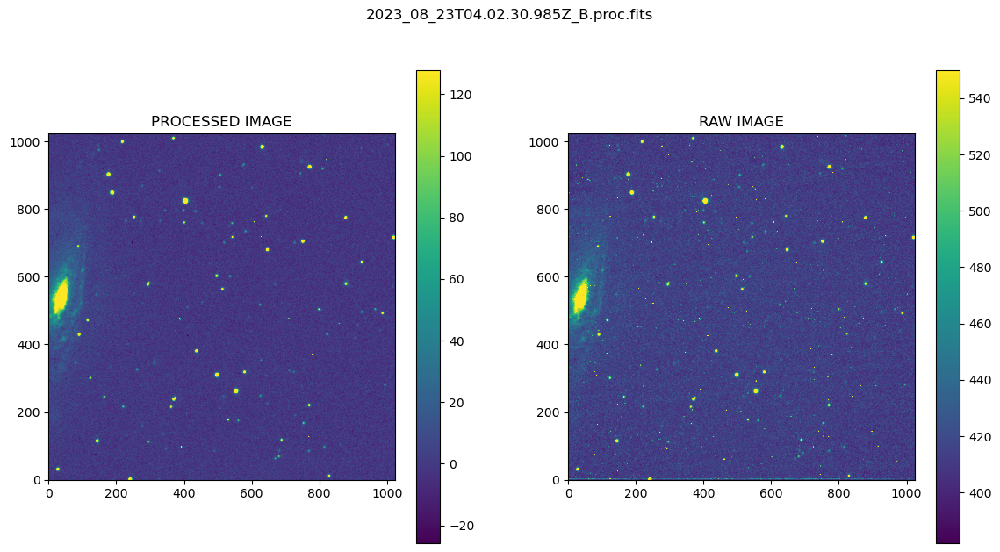

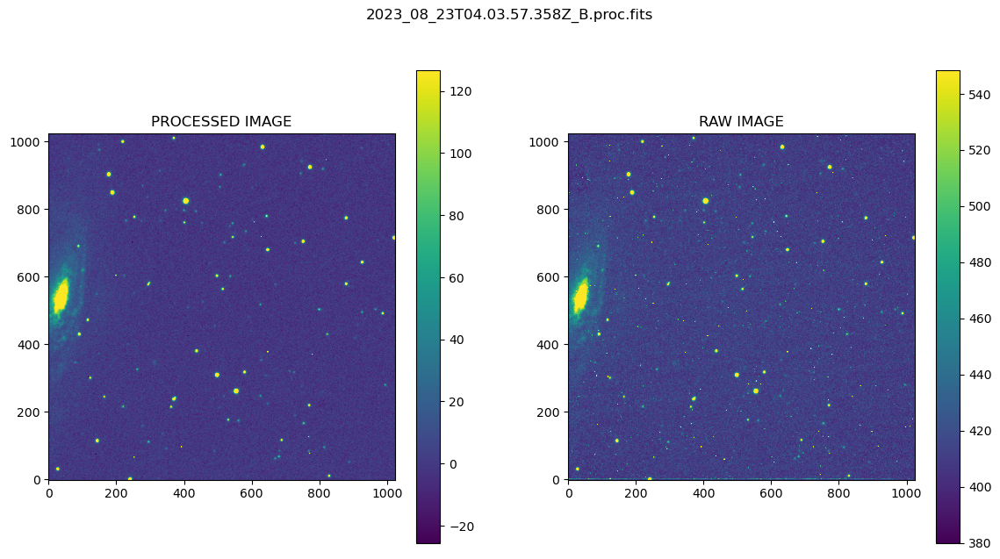

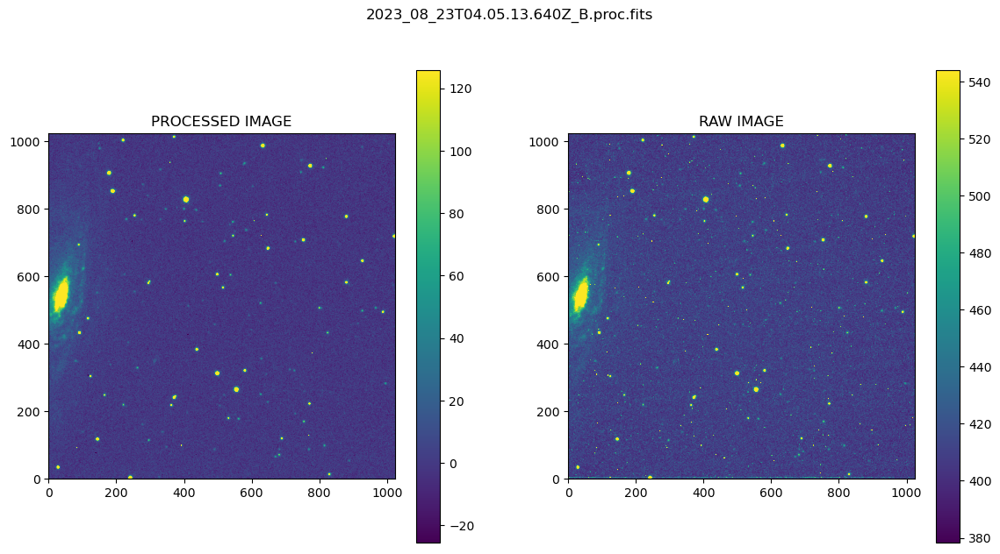

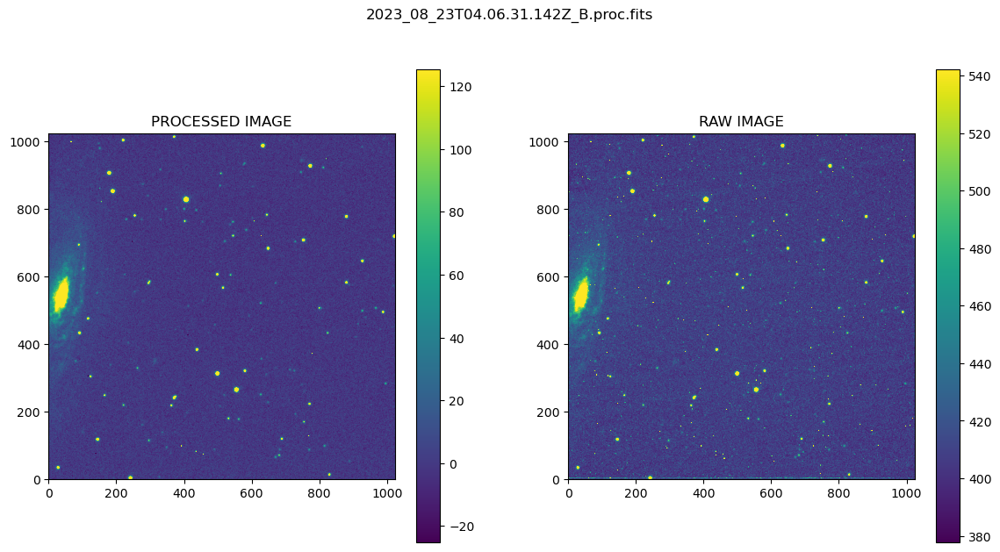

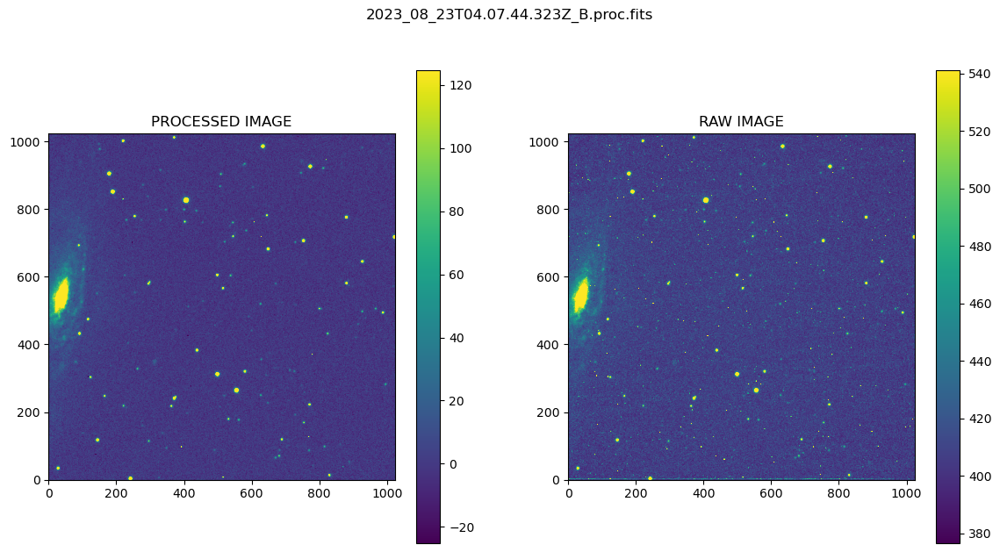

...

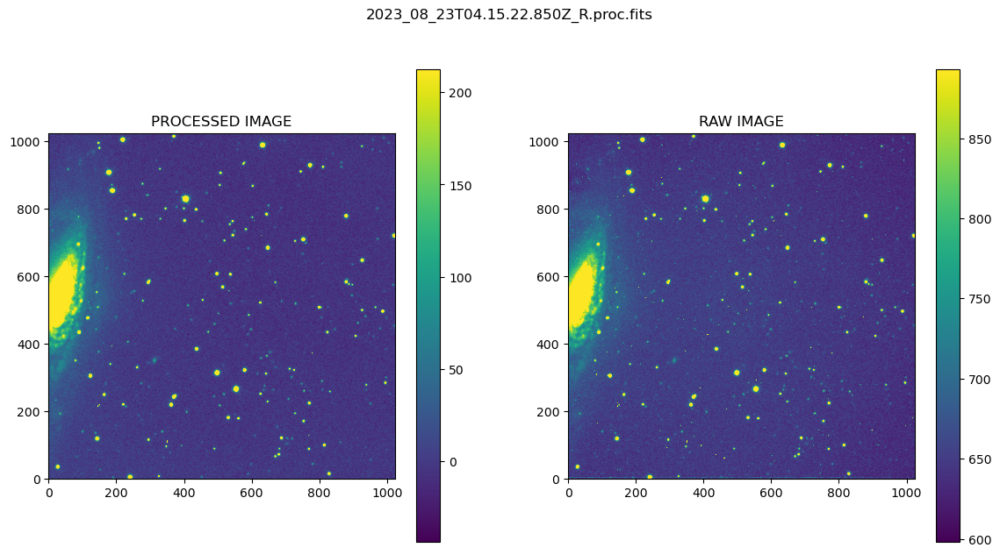

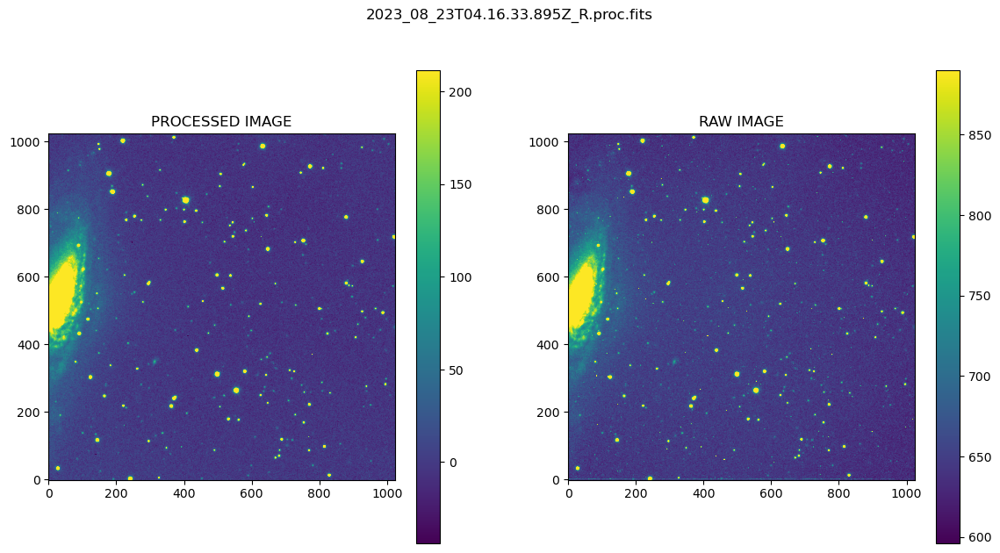

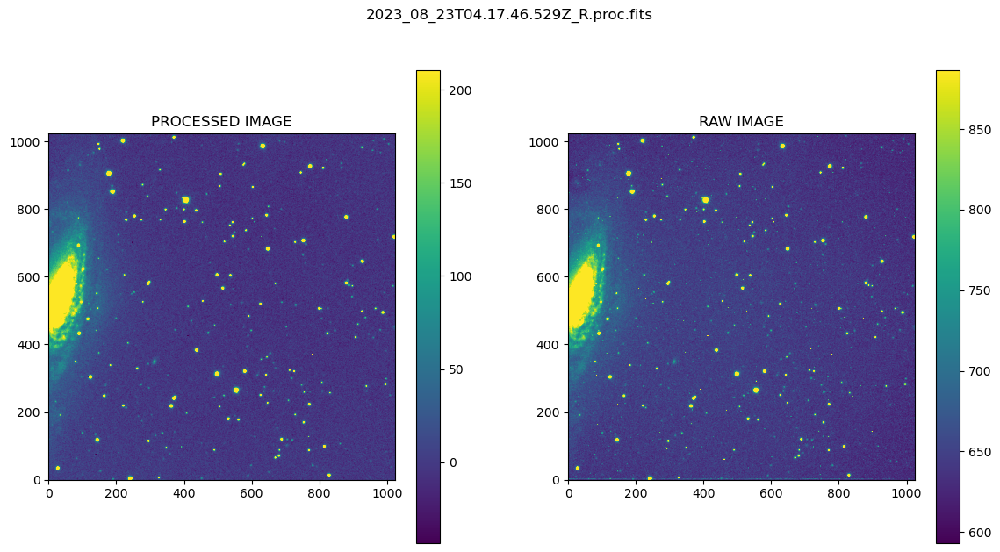

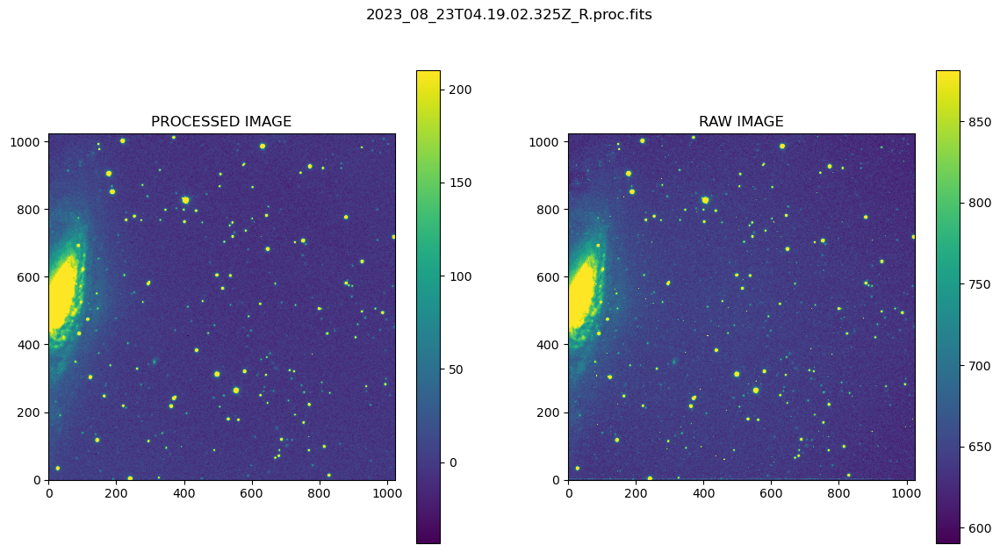

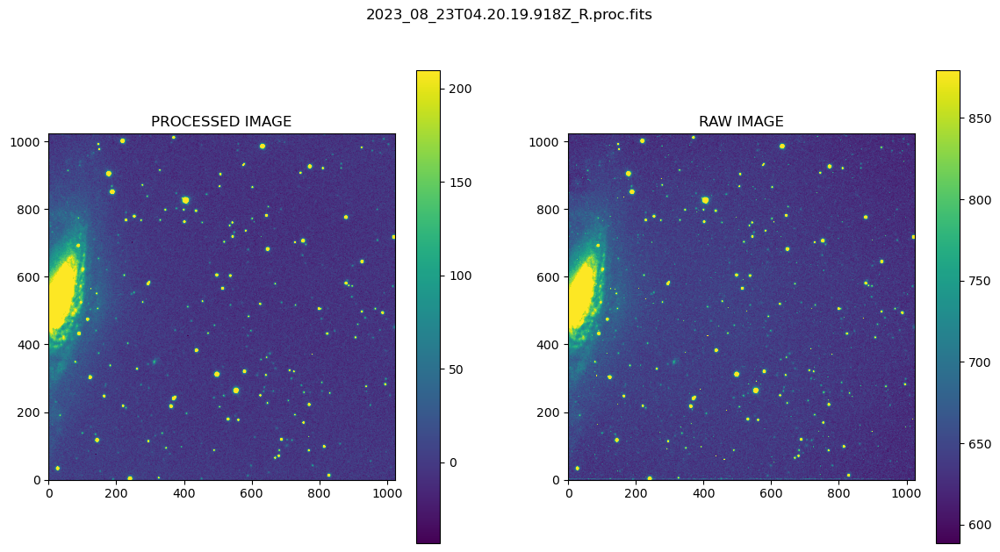

In [21]:
# Inspect the processed science files

for i in range(numSciFiles):
    fig,axes = plt.subplots(1,2,figsize=[14,7])
    
    procHDU = fits.open(procList[i])
    procData = procHDU[0].data
    print(os.path.basename(procList[i]),np.median(procData))
    header = procHDU[0].header
    procHDU.close()
    mean, median, std = sigma_clipped_stats(procData)
    im = axes[0].imshow(procData, vmin = median - 2*std, vmax = median + 10*std, origin='lower')
    fig.colorbar(im, ax=axes[0])
    axes[0].set_title('PROCESSED IMAGE')
    
    rawHDU = fits.open(sciList[i])
    rawData = rawHDU[0].data
    rawHDU.close()
    mean, median, std = sigma_clipped_stats(rawData)
    im = axes[1].imshow(rawData, vmin = median - 2*std, vmax = median + 10*std, origin='lower')
    fig.colorbar(im, ax=axes[1])
    axes[1].set_title('RAW IMAGE')
    
    fig.suptitle(os.path.basename(procList[i]))


These images are suitable for some types of scientific analysis.  However, we would also like to combine all frames of the same filter together to increase the signal to noise.  This is not as simple as combining the biases or the flats: the images were dithered (the telescope was moved between each exposure) so the astronomical sources lie at different pixel positions in different images. If you open all the processed image in ds9 and lock the frame, you can see the dithering clearly. We will have to align the images relative to each other before stacking.

## Relative astrometric aligment

Aligning images is a form of astrometry (the measurement of precise positions of objects on the sky).  We will worry about absolute astrometry versus the all-sky RA, DEC reference system later, but we do need a way to measure and remove the relative offsets between images now. If you opened the processed images in ds9, you may see that the stars are not exactly aligned. If our image-to-image dithering motions are small, the telescope field of view does not contain significant distortions, and the instrument was not rotated, we can do this ourselves in Python by measuring the relative positions of a reference star from image to image and offsetting. (Note: this task would be very easy using iraf, but we will do manually with python anyway.)

### Measure reference star locations

The first step is to find a nice reference star near the center of the image.  By measuring its centroid as it shifts between all three images, we can calculate how much to offset each image to line them up with each other.  Fortunately there are multiple stars in this image that are well-suited for this purpose.  We will select one of the stars at the approximate location (500,605).  But it would be better to measure the position more precisely, so the below loop takes a little cutout around our rough position in each image, calculates the centroid, and stores that in a separate list.

Image 2023_08_23T04.02.30.985Z_B.proc.fits : 496.8351504087272 603.3101322358132
Image 2023_08_23T04.03.57.358Z_B.proc.fits : 497.49062241815943 603.3537665299963
Image 2023_08_23T04.05.13.640Z_B.proc.fits : 498.2343376616737 604.093231073276
Image 2023_08_23T04.06.31.142Z_B.proc.fits : 498.48703660913304 604.7588071989893
Image 2023_08_23T04.07.44.323Z_B.proc.fits : 498.4441290984362 605.4630731600661
Image 2023_08_23T04.08.55.679Z_V.proc.fits : 497.8462740921984 605.4372590079845
Image 2023_08_23T04.10.16.607Z_V.proc.fits : 498.3922951838963 605.9328004905035
Image 2023_08_23T04.11.28.447Z_V.proc.fits : 497.9138480275808 606.2671347267685
Image 2023_08_23T04.12.56.772Z_V.proc.fits : 497.63172315822914 606.7751590558366
Image 2023_08_23T04.14.08.565Z_V.proc.fits : 498.2414817639423 606.475145257638
Image 2023_08_23T04.15.22.850Z_R.proc.fits : 497.5425163618569 605.8600462118014
Image 2023_08_23T04.16.33.895Z_R.proc.fits : 497.81407064074546 605.6668758163206
Image 2023_08_23T04.17.46.

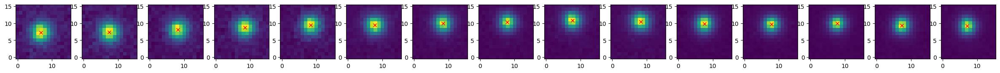

In [22]:
## Measure the precise position of a star in each image

# Set the approximate star coordinates
estimated_star_x = 498
estimated_star_y = 604
actual_star_x = np.zeros(numSciFiles)
actual_star_y = np.zeros(numSciFiles)
half_crop_size = 8
fig,axes = plt.subplots(1,numSciFiles,figsize=[30,2.5])
for i in range(numSciFiles):
        HDUList = fits.open(procList[i])
        procData = HDUList[0].data
        HDUList.close()
        (x0, x1) = (estimated_star_x-half_crop_size, estimated_star_x+half_crop_size)
        (y0, y1) = (estimated_star_y-half_crop_size, estimated_star_y+half_crop_size)
        cutout = procData[y0:y1,x0:x1]
        mean, median, std = sigma_clipped_stats(cutout)
        cx, cy = photutils.centroids.centroid_2dg(cutout) #centroid_2dg, centroid_com
        actual_star_x[i] = cx+x0
        actual_star_y[i] = cy+y0
        print('Image', os.path.basename(procList[i]), ':', actual_star_x[i], actual_star_y[i])
    
        ax = axes[i]
        ax.imshow(cutout,origin='lower')
        ax.plot([actual_star_x[i]-x0],[actual_star_y[i]-y0],'x',linestyle='',color='red')
        

### Apply offsets and crop/shift images

Next we apply these offsets to the image.  In the general case (e.g. if rotations are involved or if the pixel offsets are not pure integers), this involves resampling the image along a new coordinate grid.  To keep things simple, we are just going to apply a simple integer offset by taking appropriately matching slices of each array.  



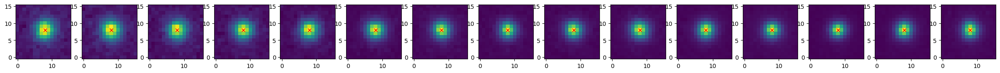

In [23]:
## Offset each image using scipy.ndimage.shift
fig,axes = plt.subplots(1,numSciFiles,figsize=[30,2.5])
for i in range(numSciFiles):
        HDUList = fits.open(procList[i])
        procData = HDUList[0].data
        header = HDUList[0].header
        HDUList.close()
        x_shift, y_shift = estimated_star_x-actual_star_x[i],estimated_star_y-actual_star_y[i]
        img_shifted = scipy.ndimage.shift(procData, [y_shift, x_shift], mode='constant')
        fits.writeto(alignedList[i],data=img_shifted,header=header,overwrite=True)

        #plot the cutout of the same star from the shifted image to check
        (x0, x1) = (estimated_star_x-half_crop_size, estimated_star_x+half_crop_size)
        (y0, y1) = (estimated_star_y-half_crop_size, estimated_star_y+half_crop_size)
        cutout = img_shifted[y0:y1,x0:x1]

        ax = axes[i]
        ax.imshow(cutout,origin='lower')
        ax.plot([half_crop_size],[half_crop_size],'x',linestyle='',color='red') #mark the center of the cropped image

Now you can see that the stars are aligned at the center of the cropped image. You should use ds9 to check the results for overall consistency. Once all aligned fits are opennedhalf_crop_size. Go to Frame>Lock>Frame>Image.

### Median-combine science images

In the last step, you will median-combine the aligned images together (in case you haven't noticed, optical astronomers are really into medians).  Note that while we have subtracted the sky, we have not scaled the data, so we are assuming all three images have the same exposure time and very similar sky conditions (no clouds).  In variable seeing or transparency a median combination will produce strange results!

#### EXERCISE 8: Median-combine the shifted science images and save the result to disk.   For the output filename, use the string stored in combinedFile.  (Hint: use nanmedian for the stack, and re-use code from when the processed files were written to disk)

In [24]:
## getting the names of the sci images and group them according to their filters
filters = ['B','V','R']
alignedList_by_filter = {}
for filt in filters:
    alignedList_by_filter[filt] = [] #empty list
    #getting the list of flat fields in this filter
    for fileName in alignedList:
        header = fits.getheader(fileName) # Get the header for this file.
        if header['FILTER'] == filt:
            alignedList_by_filter[filt].append(fileName)
            
## EXERCISE 8: Median-combine the shifted/cropped science images and save the result to disk.
for filt in filters:
    nfiles_thisfilter = len(alignedList_by_filter[filt])
    sci_outfile = combinedFile%filt
    rms_outfile = rmsFile%filt
    for i in range(nfiles_thisfilter):
        HDUList = fits.open(alignedList_by_filter[filt][i])
        primaryHeader = HDUList[0].header
        image = HDUList[0].data
        HDUList.close()
        if i==0:
            alignedImages = np.zeros((image.shape[0],image.shape[1], nfiles_thisfilter))
        alignedImages[:,:,i] = image
    combinedImage = np.nanmedian(alignedImages, axis=2)
    rmsImage = np.sqrt(np.sum(alignedImages**2, axis=2)/nfiles_thisfilter)
    
    # Prepare the output FITS structure in simple format
    combinedHDU = fits.PrimaryHDU(combinedImage)  # Create a new HDU with the processed image data
    combinedHDU.header = primaryHeader            # Copy over the header from the (first) raw file
    combinedHDU.header.add_history('Median-combined:'+','.join(alignedList_by_filter[filt])) # Add a note to the header
    combinedHDU.writeto(sci_outfile, overwrite=True)
    
    rmsHDU = fits.PrimaryHDU(rmsImage)  # Create a new HDU with the processed image data
    rmsHDU.header = primaryHeader            # Copy over the header from the (first) raw file
    rmsHDU.header.add_history('Median-combined:'+','.join(alignedList_by_filter[filt])) # Add a note to the header
    rmsHDU.writeto(rms_outfile, overwrite=True)



Now we will display the resulting images in rgb colors.

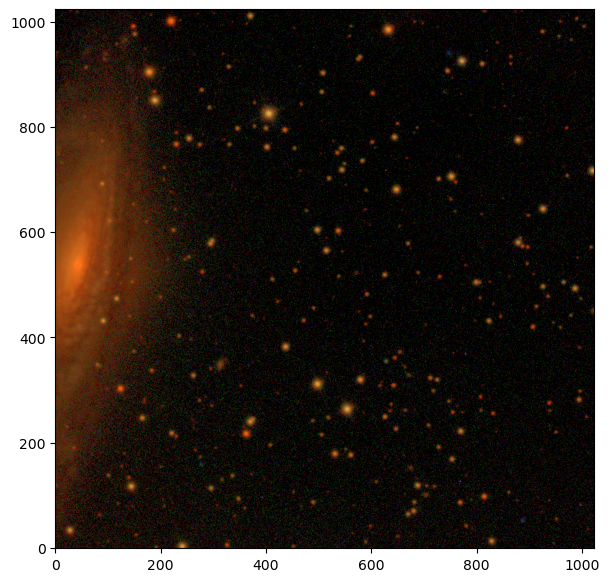

In [32]:
R_im = fits.getdata(combinedFile%'R')
V_im = fits.getdata(combinedFile%'V')
B_im = fits.getdata(combinedFile%'B')
division = np.percentile(B_im,80)
image_data = make_lupton_rgb(R_im/division, V_im/division, 
                             B_im/division, Q=20, stretch=10, minimum = 0)
fig = plt.figure(figsize=[7,7])
plt.imshow(image_data,origin='lower')
plt.show()

## Concluding remarks

At this point, we're done!  Either of the above images could be used for photometry or for other forms of image analysis that will you learn about in the next session.

It is important to note that procedures may differ from telescope to telescope and depending on the type of analysis you're interested in.  Depending on your detector, filter passband, the number of exposures, the time-variability of your source, whether the moon is up or down, whether clouds were present, and the specifications of the type of science you need to do, you may need to carry out additional steps or different steps, such as:

* Overscan subtraction
* Bad pixel masking
* Source masking in sky flat construction
* Super-sky flat construction and subtraction
* Linearity correction
* Fringe correction or subtraction
* Median-filtered or model-based sky subtraction
* Dithered-group sky subtraction
* Cosmic ray filtering/masking
* Photometric scaling of individual exposures
* Astrometric distortion corrections

### Cleanup

To save disk space, you can execute the cell below to remove your processed data.

In [26]:
## WARNING: WILL REMOVE YOUR PROCESSED DATA FROM THIS NOTEBOOK
#for file in glob.glob(procFolder+"/*proc.fits"):
#    os.remove(file)
#for file in glob.glob(procFolder+"/*aligned.fits"):
#    os.remove(file)